# Import Data

In [1]:
import pandas as pd
import numpy as np
import zipfile
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler

from scipy import stats
from scipy.stats import zscore

from imblearn.over_sampling import SMOTE

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [2]:
zip_path = "E:\Coding\sem5\DL\ProjekAkhirDL\ALLFLOWMETER_HIKARI2021.zip"

with zipfile.ZipFile(zip_path, 'r') as zipped_file:
    csv_file_name = zipped_file.namelist()[0]

    with zipped_file.open(csv_file_name) as csv_file:
        df = pd.read_csv(csv_file)

<>:1: SyntaxWarning: invalid escape sequence '\C'
<>:1: SyntaxWarning: invalid escape sequence '\C'
C:\Users\hadik\AppData\Local\Temp\ipykernel_25468\798606535.py:1: SyntaxWarning: invalid escape sequence '\C'
  zip_path = "E:\Coding\sem5\DL\ProjekAkhirDL\ALLFLOWMETER_HIKARI2021.zip"


In [3]:
df.head()

,Unnamed: 0.1,Unnamed: 0,uid,originh,originp,responh,responp,flow_duration,fwd_pkts_tot,bwd_pkts_tot,...,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size,traffic_category,Label
0,0,0,Cg61Jch3vdz9DBptj,103.255.15.23,13316,128.199.242.104,443,2.207588,15,14,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,29200,65160,0,Bruteforce-XML,1
1,1,1,CdRIlqLWdj35Y9vW9,103.255.15.23,13318,128.199.242.104,443,15.624266,15,14,...,1.534300e+07,1.534300e+07,1.534300e+07,1.534300e+07,0.0,29200,65160,0,Bruteforce-XML,1
2,2,2,CLzp9Khd0Y09Qkgrg,103.255.15.23,13320,128.199.242.104,443,12.203357,14,13,...,1.196814e+07,1.196814e+07,1.196814e+07,1.196814e+07,0.0,29200,65160,0,Bruteforce-XML,1
3,3,3,Cnf1YA4iLB4CSNWB88,103.255.15.23,13322,128.199.242.104,443,9.992448,14,13,...,9.759205e+06,9.759205e+06,9.759205e+06,9.759205e+06,0.0,29200,65160,0,Bruteforce-XML,1
4,4,4,C4ZKvv3fpO72EAOsJ6,103.255.15.23,13324,128.199.242.104,443,7.780611,14,14,...,7.545305e+06,7.545305e+06,7.545305e+06,7.545305e+06,0.0,29200,65160,0,Bruteforce-XML,1


In [4]:
df = df.drop(labels='Label', axis=1)

# Data preprocessing

## Label Encoding

In [5]:
encoder = LabelEncoder()

def LabelEncoding(df):
    object_features = df.select_dtypes(include=['object'])
    for col in object_features:
        df[col] = encoder.fit_transform(df[col])
    return df

## Z-Score Standarization

In [6]:
def Standarization(df):
    df_zscore = df.apply(lambda x: zscore(x) if x.dtype in ['float64', 'int64'] else x)
    return df_zscore

## MinMax Normalization

In [7]:
minmax = MinMaxScaler()

def Normalization(df):
    df_scaled = minmax.fit_transform(df)
    df = pd.DataFrame(df_scaled, columns=df.columns)
    return df

## Execute Preprocessing

In [8]:
df = LabelEncoding(df)

In [9]:
df.head()

,Unnamed: 0.1,Unnamed: 0,uid,originh,originp,responh,responp,flow_duration,fwd_pkts_tot,bwd_pkts_tot,...,active.std,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size,traffic_category
0,0,0,376469,123,13316,1371,443,2.207588,15,14,...,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,29200,65160,0,3
1,1,1,352711,123,13318,1371,443,15.624266,15,14,...,158109.181742,1.534300e+07,1.534300e+07,1.534300e+07,1.534300e+07,0.0,29200,65160,0,3
2,2,2,196673,123,13320,1371,443,12.203357,14,13,...,125449.251656,1.196814e+07,1.196814e+07,1.196814e+07,1.196814e+07,0.0,29200,65160,0,3
3,3,3,443997,123,13322,1371,443,9.992448,14,13,...,123182.931318,9.759205e+06,9.759205e+06,9.759205e+06,9.759205e+06,0.0,29200,65160,0,3
4,4,4,40515,123,13324,1371,443,7.780611,14,14,...,126016.885411,7.545305e+06,7.545305e+06,7.545305e+06,7.545305e+06,0.0,29200,65160,0,3


# Data analysis

Analisis data perlu dilakukan untuk mengecek apakah distribusi class di data dan outlier. jika class tidak seimbang, maka dibutuhkan imbalance handling dan jika data memiliki outlier, maka dibutuhkan outlier handling

## Label meaning

0: Background,

1: Benign,

2: Bruteforce, 

3: Bruteforce-XML, 

4: Probing, 

5: XMRIGCC CryptoMiner

## Data Example

Example of 1 row of data

0
0
Cg61Jch3vdz9DBptj
103.255.15.23
13316
128.199.242.104
443
2.207588
15
14
6
6
6.794746
6.341763
13.136509
0.933333
464
20
40
492
32
44
2
2
2
6
5
26
0
0
0
0
0.0
742.0
1826.0
121.733333
220.736581
0.0
1448.0
5025.0
358.928571
552.23984
0.0
1448.0
6851.0
236.241379
424.859275
18.119812
1963762.044907
2207602.977753
157685.926982
520505.22679
7.867813
2032928.943634
2177949.905396
167534.608107
560626.711841
7.867813
1963762.044907
2207602.977753
78842.963491
369637.838843
3103.387105
7.5
7.0
913.0
2512.5
0.0
0.0
0.0
0.0
0.0
0.0
2207602.977753
2207602.977753
2207602.977753
2207602.977753
0.0
0.0
0.0
0.0
0.0
0.0
29200
65160
0
Bruteforce-XML
1

## Class distribution in every features

In [10]:
df['traffic_category'].value_counts()

traffic_category
1    347431
0    170151
4     23388
2      5884
3      5145
5      3279
Name: count, dtype: int64

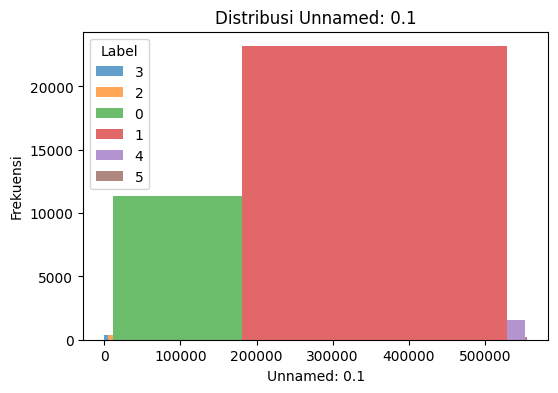

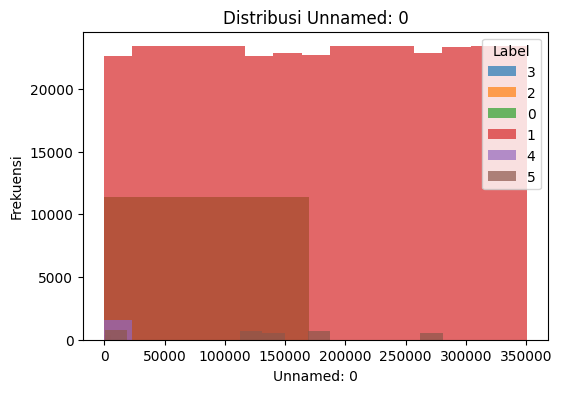

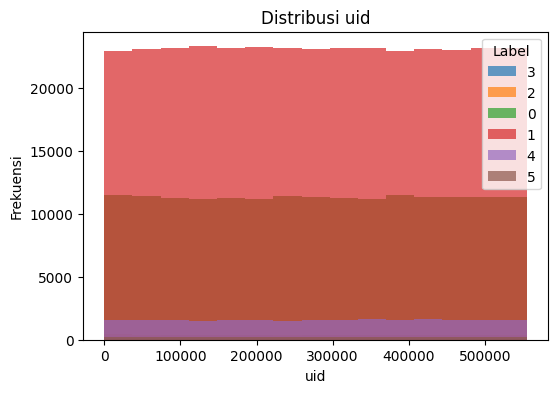

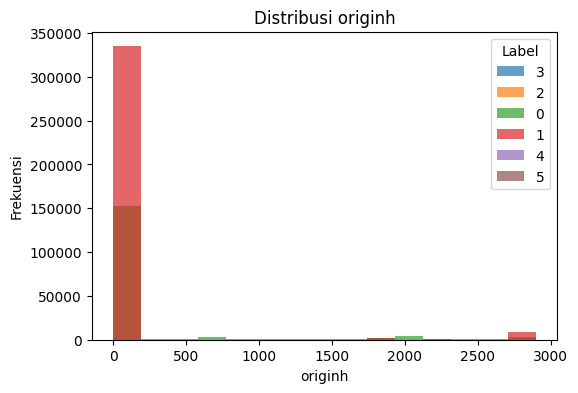

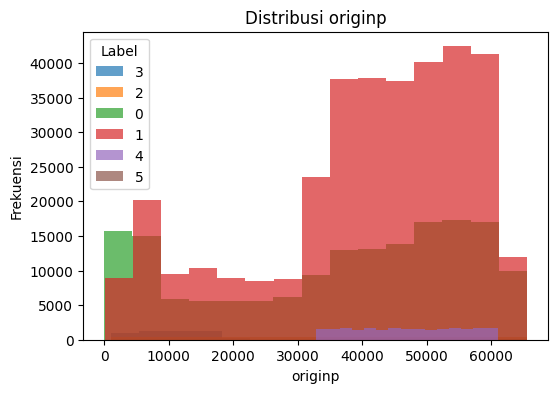

...

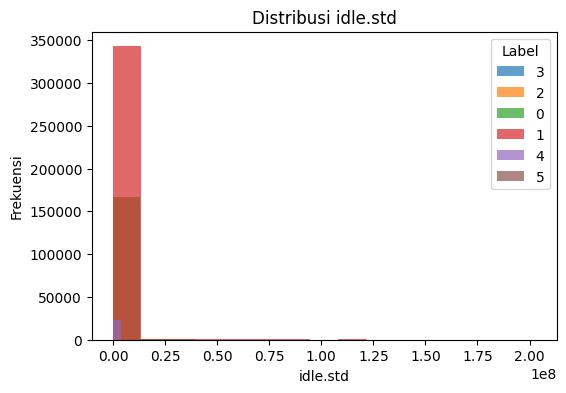

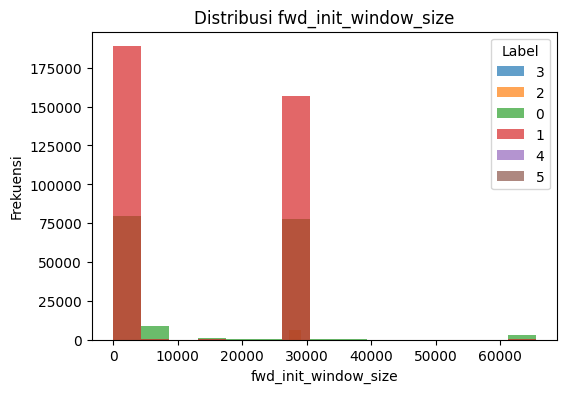

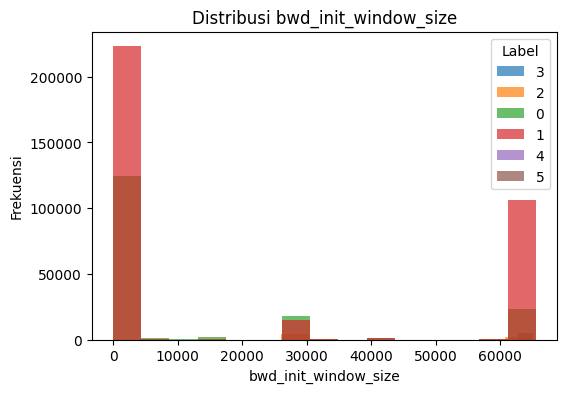

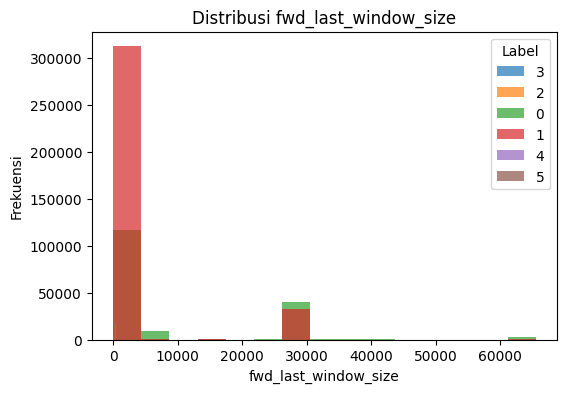

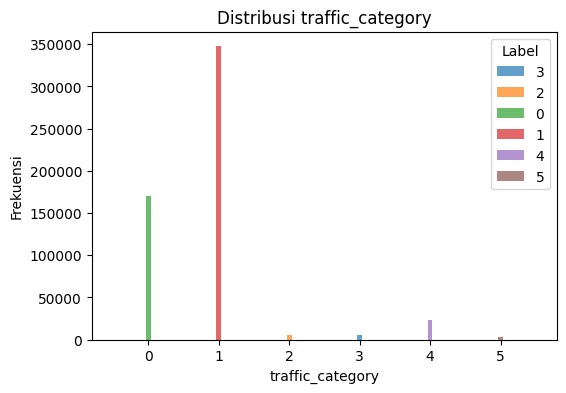

In [11]:
for feature in df.columns:
    plt.figure(figsize=(6, 4))
    for label in df['traffic_category'].unique():
        subset = df[df['traffic_category'] == label]
        plt.hist(subset[feature], alpha=0.7, bins=15, label=label)
    plt.title(f'Distribusi {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frekuensi')
    plt.legend(title="Label")
    plt.show()

## Outliers checking

In [12]:
z_scores = zscore(df.select_dtypes(include=['float64', 'int64']))
outliers = (z_scores > 3) | (z_scores < -3)
outlier_counts = outliers.sum(axis=0)

outlier_summary = pd.DataFrame({
    "Feature": df.select_dtypes(include=['float64', 'int64']).columns,
    "Outlier Count": outlier_counts
}).sort_values(by="Outlier Count", ascending=False)

print(outlier_summary)

                                   Feature  Outlier Count
bwd_bulk_rate                bwd_bulk_rate          20418
bwd_pkts_per_sec          bwd_pkts_per_sec          15173
idle.min                          idle.min          14924
flow_pkts_per_sec        flow_pkts_per_sec          14272
bwd_pkts_payload.avg  bwd_pkts_payload.avg          14190
...                                    ...            ...
Unnamed: 0                      Unnamed: 0              0
fwd_header_size_max    fwd_header_size_max              0
bwd_header_size_min    bwd_header_size_min              0
bwd_header_size_max    bwd_header_size_max              0
Unnamed: 0.1                  Unnamed: 0.1              0

[83 rows x 2 columns]


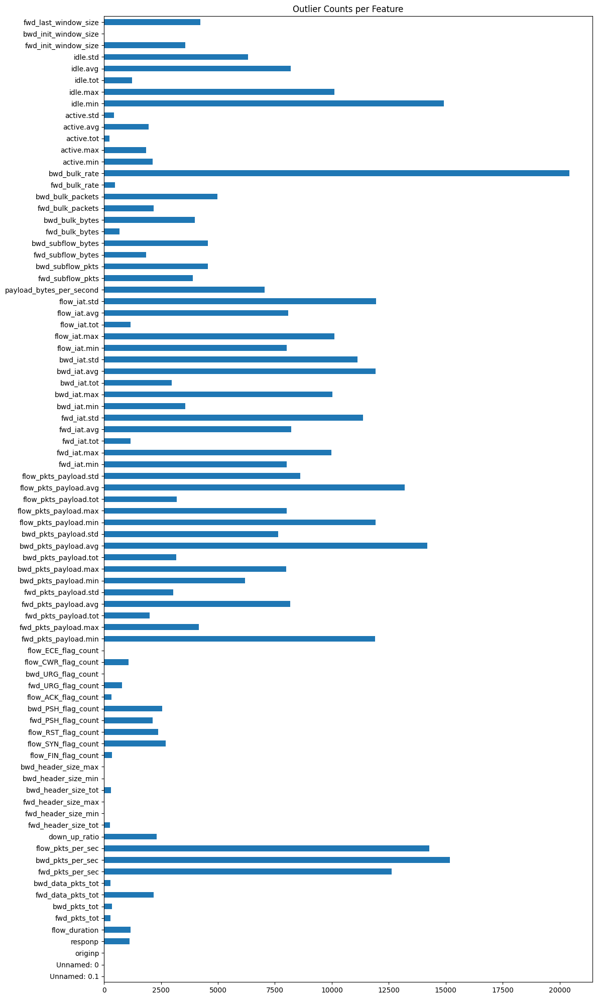

In [13]:
plt.figure(figsize=(12, 20))

outlier_counts.plot(kind='barh')
plt.title('Outlier Counts per Feature')
plt.tight_layout()
plt.show()

In [14]:
df.shape[0]

555278

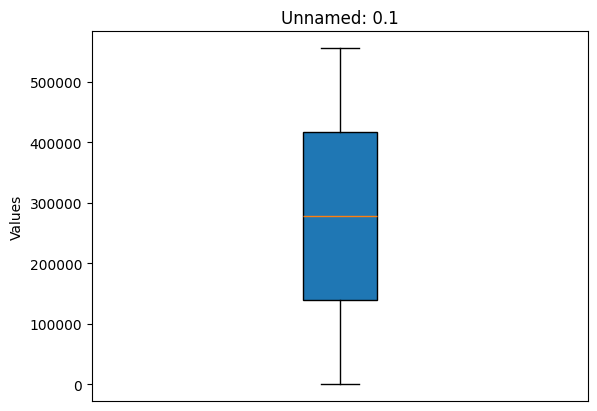

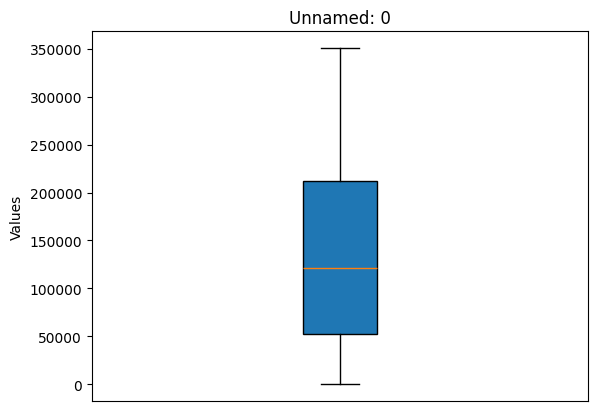

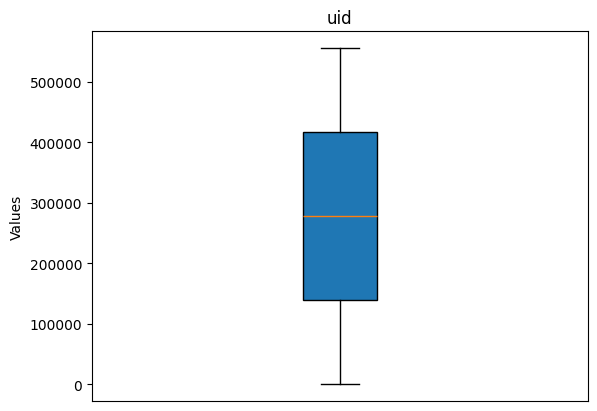

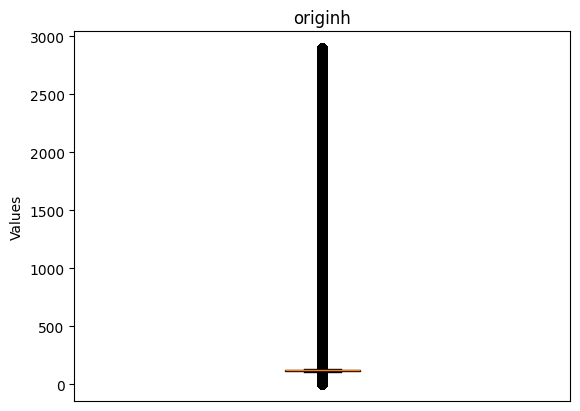

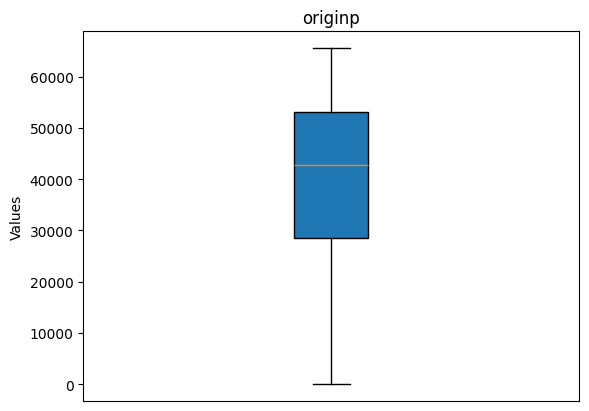

...

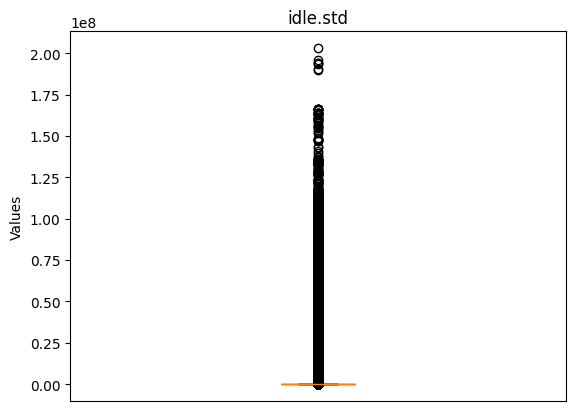

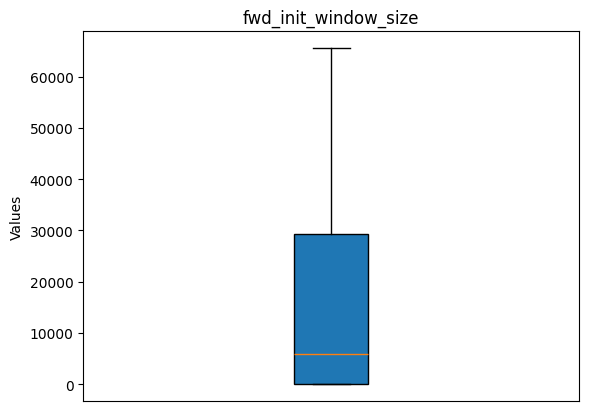

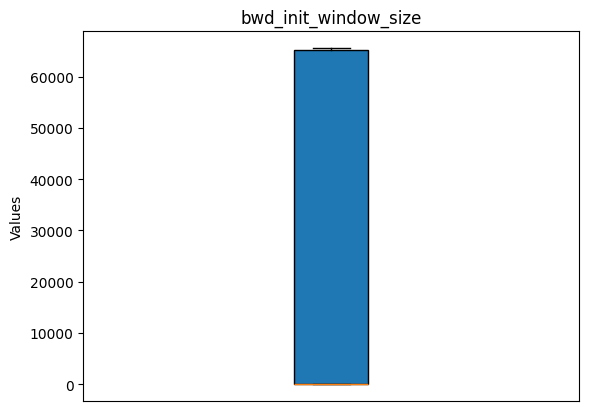

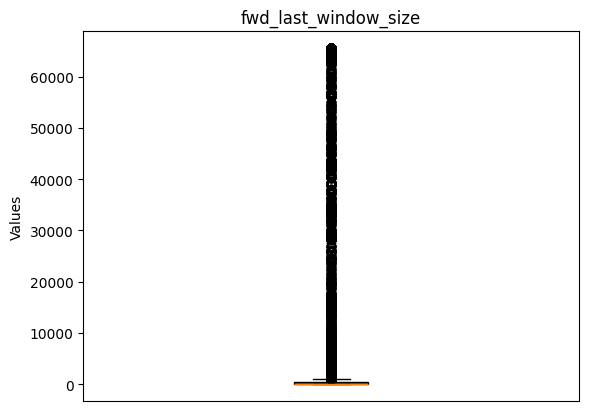

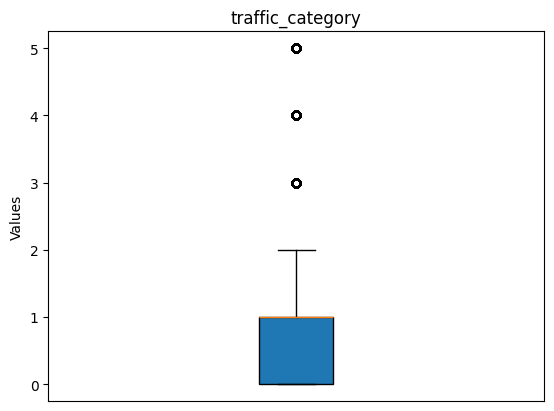

In [15]:
for col in df.columns:
    plt.boxplot(df[col], vert=True, patch_artist=True)
    plt.title(col)
    plt.ylabel("Values")
    plt.xticks([])
    plt.show()

# Results

setelah melakukan histogram pesebaran value dari label 'traffic_category' pada setiap fitur, didapatkan bahwa perbandingan antara data yang merupakan attack dan normal tidak seimbang. label background dan benign yang merupakan indikasi data normal jauh lebih banyak dibandingkan label bruteforce, bruteforce-XML, probing, dan XMRIGCC cryptominer. maka dari itu, dibutuhkan implementasi dari imbalance handling berupa penambahan data baru agar perbandingan data normal dan attack seimbang.

setelah melakukan boxplot untuk mengecek outlier, terdapat 76 dari 87 total fitur memiliki outlier. hal ini bisa disebabkan karena tidak meratanya perbandingan data normal dan attack yang menjadikan beberapa fitur yang merupakan data attack akan menjadi outlier. oleh karena itu, dibutuhkan plotting ulang setelah dilakukannya imbalance handling. untuk menentukan apakah harus menggunakan outliers handling atau tidak



# Imbalance handling using SMOTE

In [16]:
smote = SMOTE(random_state=42)

X, y = df.drop('traffic_category', axis=1), df['traffic_category']

X = Standarization(X)
X = Normalization(X)

X_resampled, y_resampled = smote.fit_resample(X,y)

df_resampled = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.DataFrame(y_resampled, columns=['traffic_category'])], axis=1)

In [17]:
df_resampled.head()

,Unnamed: 0.1,Unnamed: 0,uid,originh,originp,responh,responp,flow_duration,fwd_pkts_tot,bwd_pkts_tot,...,active.std,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size,traffic_category
0,0.000000,0.000000,0.677984,0.042443,0.202934,0.171589,0.006761,0.000127,0.000046,0.000043,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.445563,0.994278,0.0,3
1,0.000002,0.000003,0.635198,0.042443,0.202964,0.171589,0.006761,0.000898,0.000046,0.000043,...,0.000029,0.051177,0.051177,0.000882,0.051177,0.0,0.445563,0.994278,0.0,3
2,0.000004,0.000006,0.354189,0.042443,0.202995,0.171589,0.006761,0.000702,0.000043,0.000040,...,0.000023,0.039920,0.039920,0.000688,0.039920,0.0,0.445563,0.994278,0.0,3
3,0.000005,0.000009,0.799596,0.042443,0.203025,0.171589,0.006761,0.000575,0.000043,0.000040,...,0.000023,0.032552,0.032552,0.000561,0.032552,0.0,0.445563,0.994278,0.0,3
4,0.000007,0.000011,0.072964,0.042443,0.203056,0.171589,0.006761,0.000447,0.000043,0.000043,...,0.000023,0.025167,0.025167,0.000434,0.025167,0.0,0.445563,0.994278,0.0,3


# Data analysis after SMOTE

## Class distribution in every features

In [18]:
df_resampled['traffic_category'].value_counts()

traffic_category
3    347431
2    347431
0    347431
1    347431
4    347431
5    347431
Name: count, dtype: int64

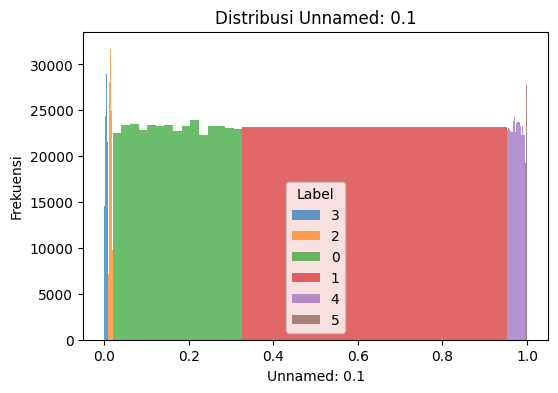

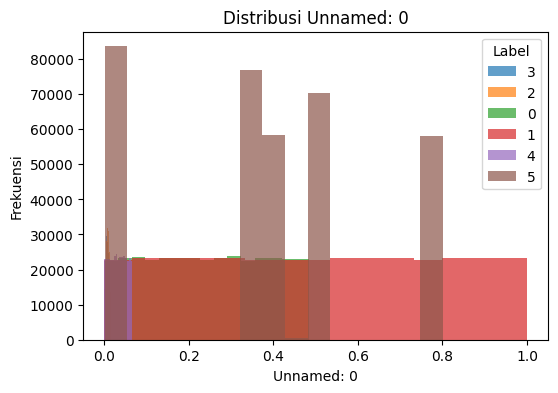

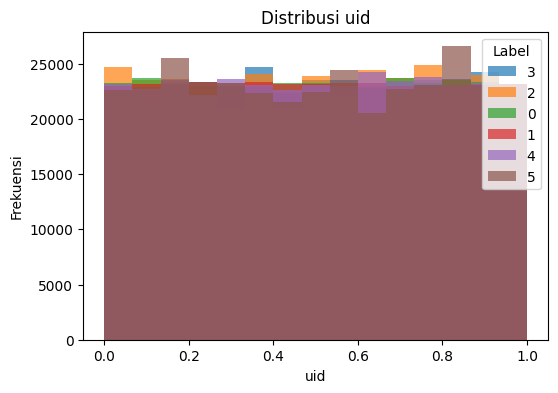

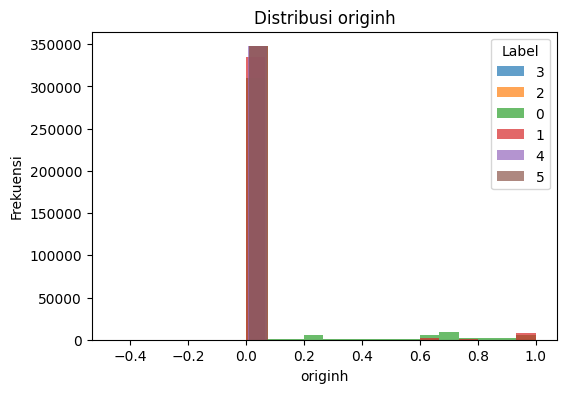

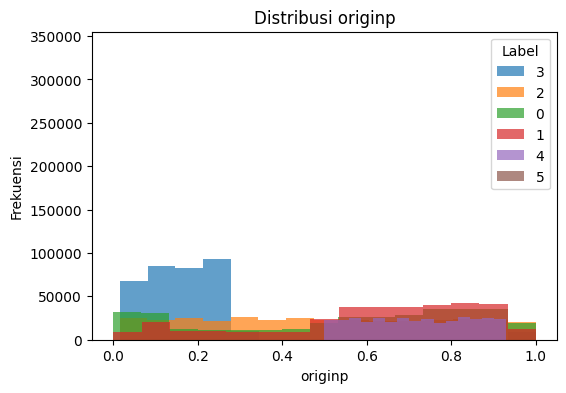

...

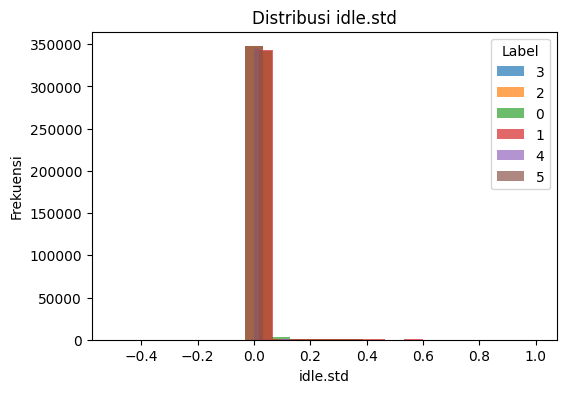

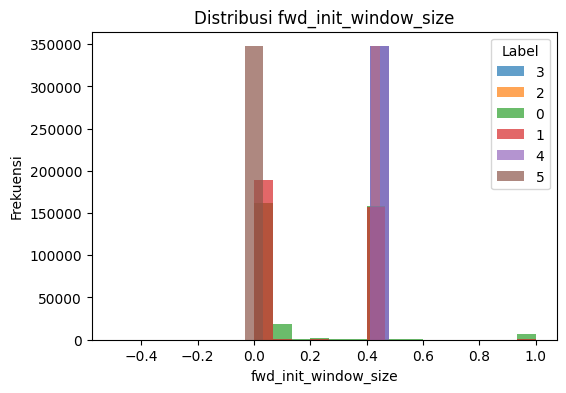

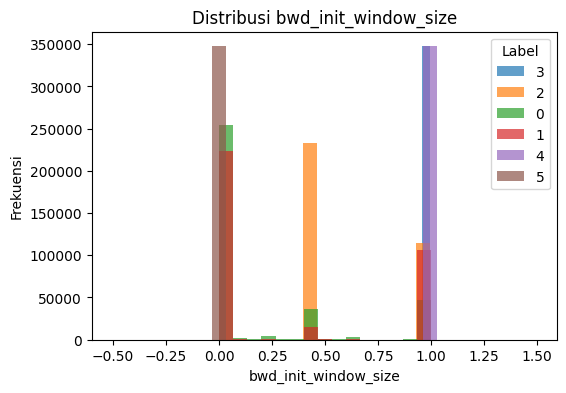

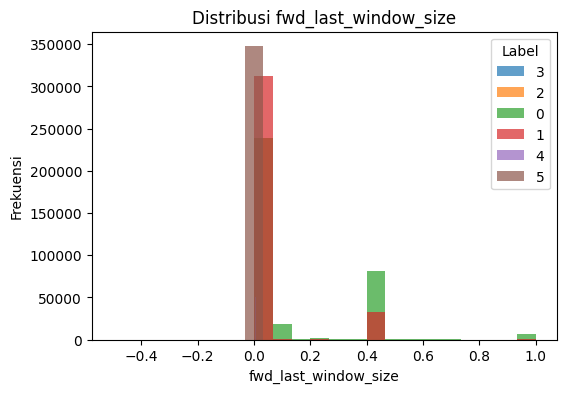

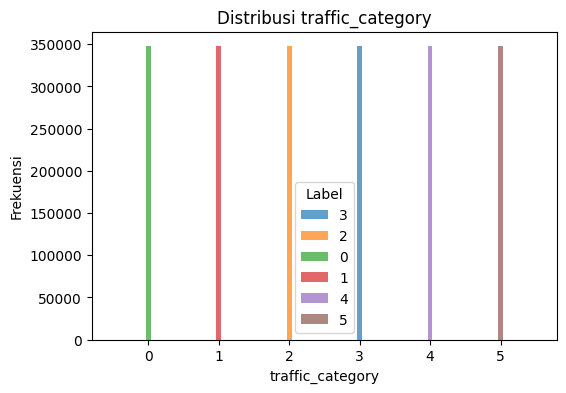

In [19]:
for feature in df_resampled.columns:
    plt.figure(figsize=(6, 4))
    for label in df_resampled['traffic_category'].unique():
        subset = df_resampled[df_resampled['traffic_category'] == label]
        plt.hist(subset[feature], alpha=0.7, bins=15, label=label)
    plt.title(f'Distribusi {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frekuensi')
    plt.legend(title="Label")
    plt.show()

## Outliers checking

In [20]:
z_scores = zscore(df_resampled.select_dtypes(include=['float64', 'int64']))
outliers = (z_scores > 3) | (z_scores < -3)
outlier_counts = outliers.sum(axis=0)

outlier_summary = pd.DataFrame({
    "Feature": df_resampled.select_dtypes(include=['float64', 'int64']).columns,
    "Outlier Count": outlier_counts
}).sort_values(by="Outlier Count", ascending=False)

print(outlier_summary)


                                   Feature  Outlier Count
fwd_last_window_size  fwd_last_window_size         122487
responp                            responp          97003
bwd_pkts_per_sec          bwd_pkts_per_sec          72567
flow_pkts_per_sec        flow_pkts_per_sec          71133
bwd_pkts_payload.avg  bwd_pkts_payload.avg          66737
...                                    ...            ...
fwd_header_size_min    fwd_header_size_min              0
responh                            responh              0
originp                            originp              0
bwd_init_window_size  bwd_init_window_size              0
Unnamed: 0.1                  Unnamed: 0.1              0

[86 rows x 2 columns]


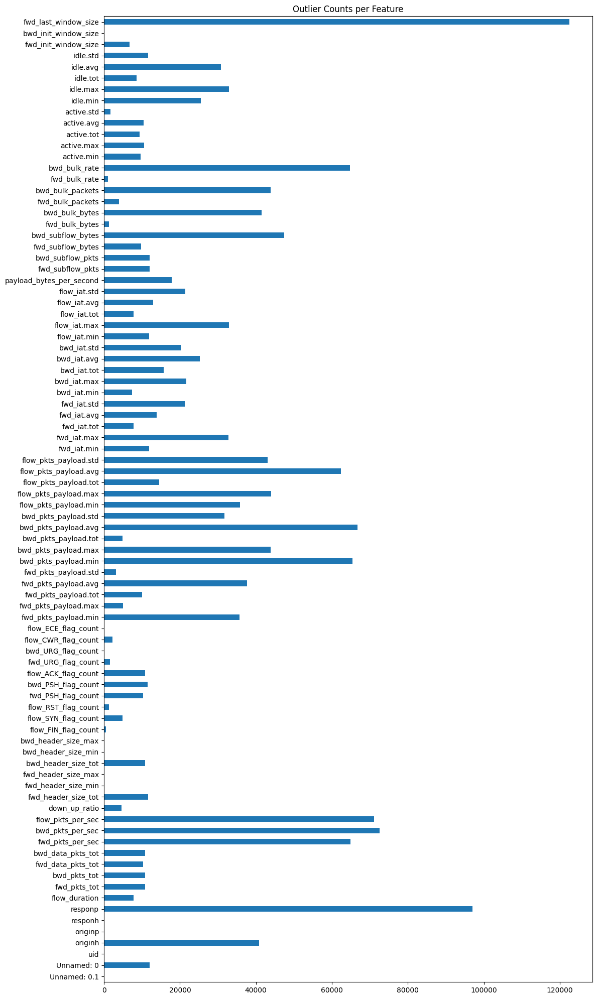

In [21]:
plt.figure(figsize=(12, 20))

outlier_counts.plot(kind='barh')
plt.title('Outlier Counts per Feature')
plt.tight_layout()
plt.show()

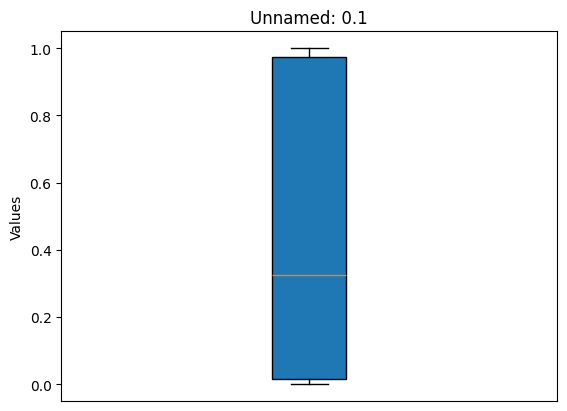

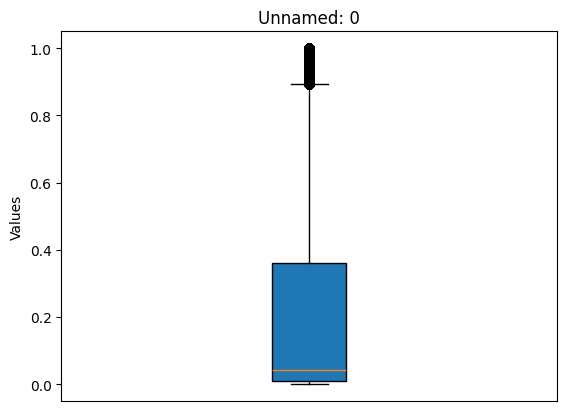

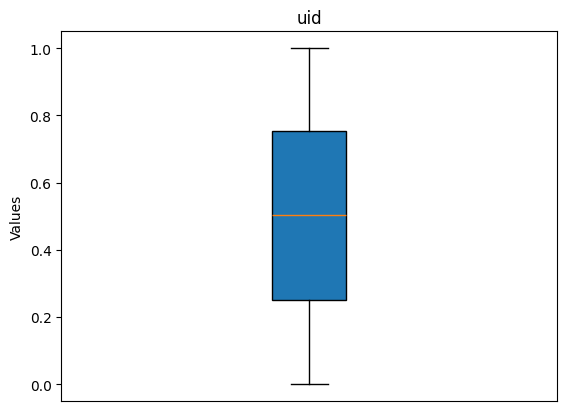

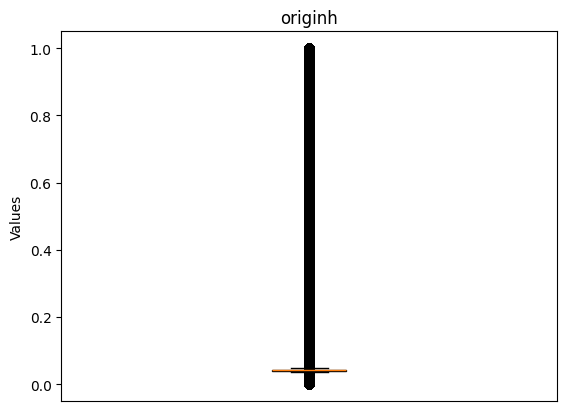

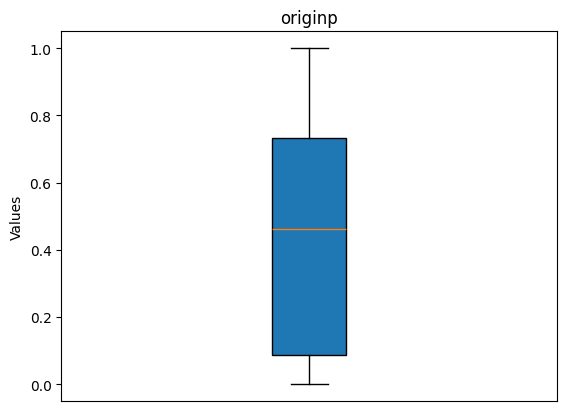

...

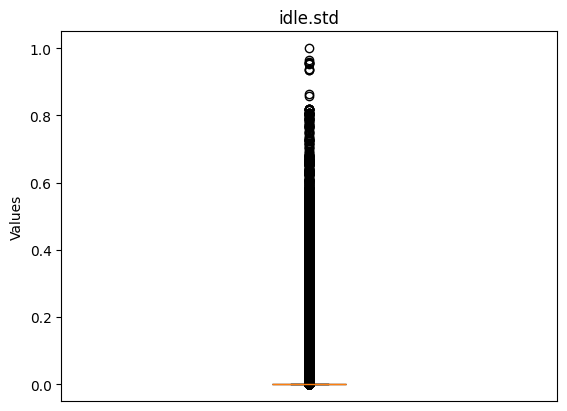

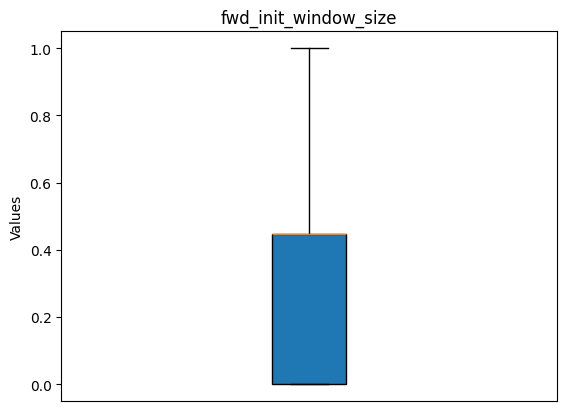

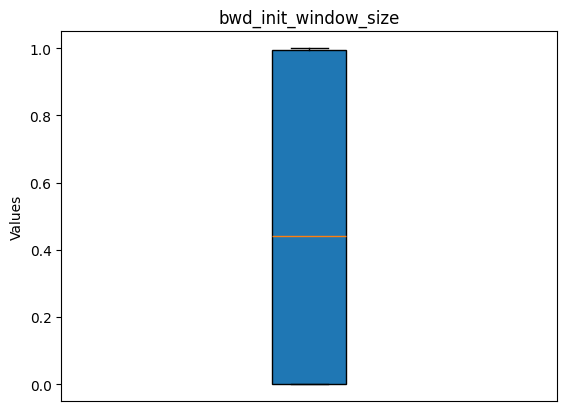

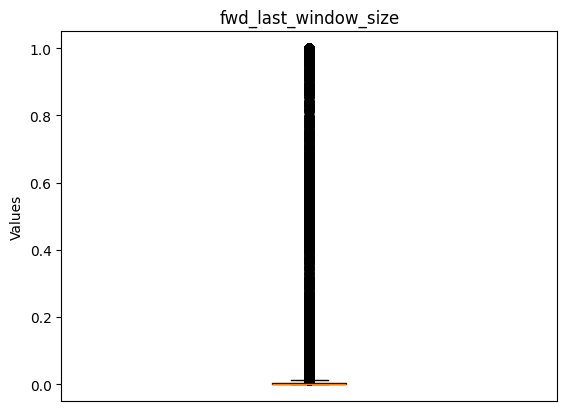

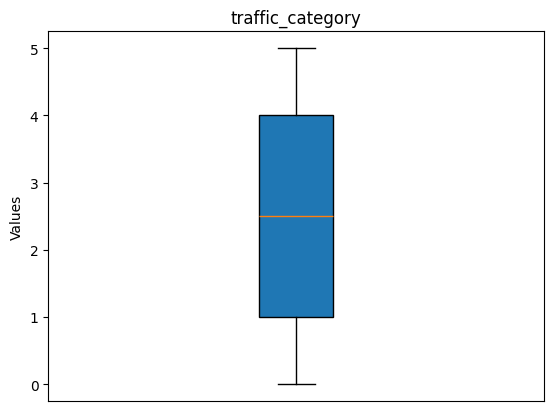

In [22]:
for col in df_resampled.columns:
    plt.boxplot(df_resampled[col], vert=True, patch_artist=True)
    plt.title(col)
    plt.ylabel("Values")
    plt.xticks([])
    plt.show()

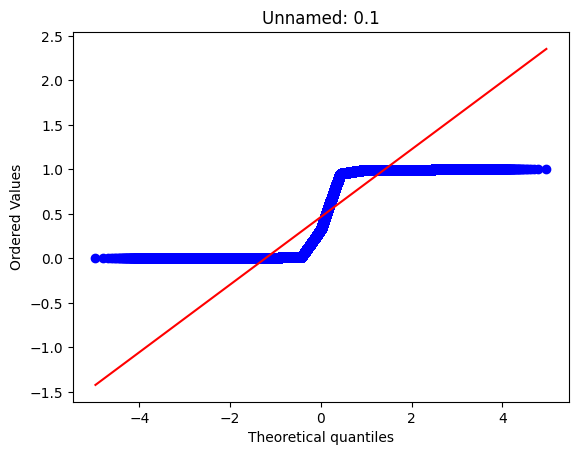

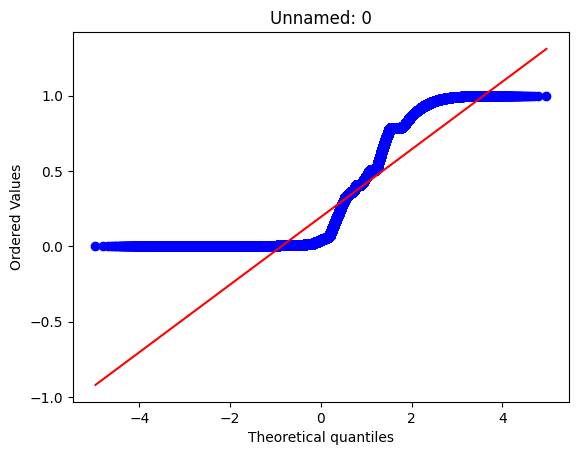

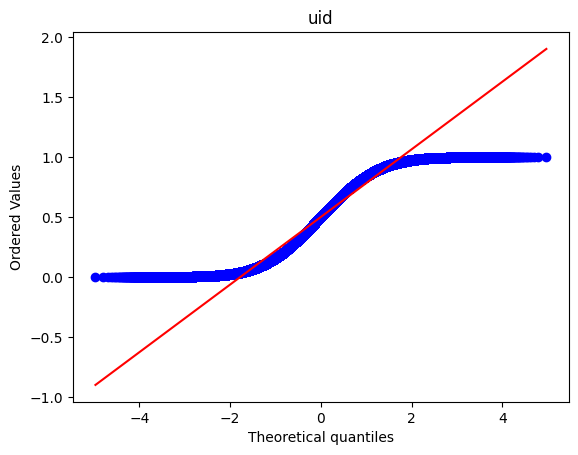

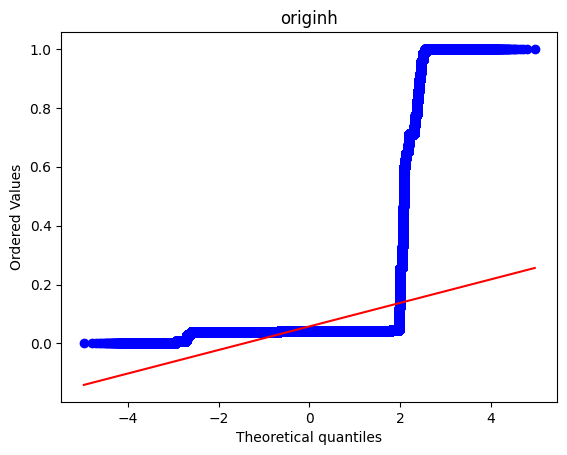

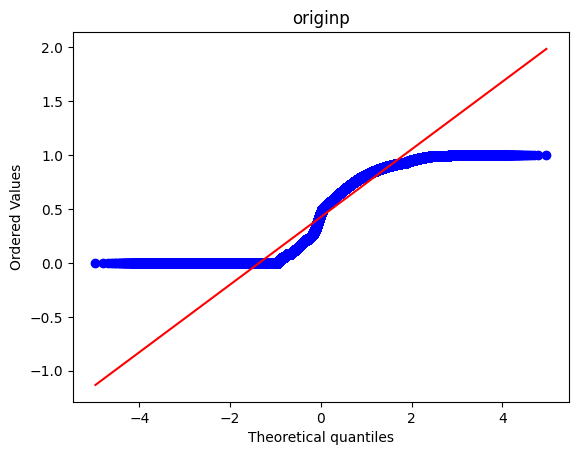

...

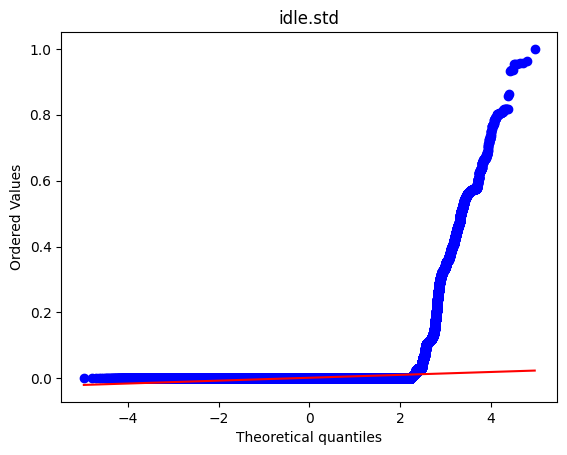

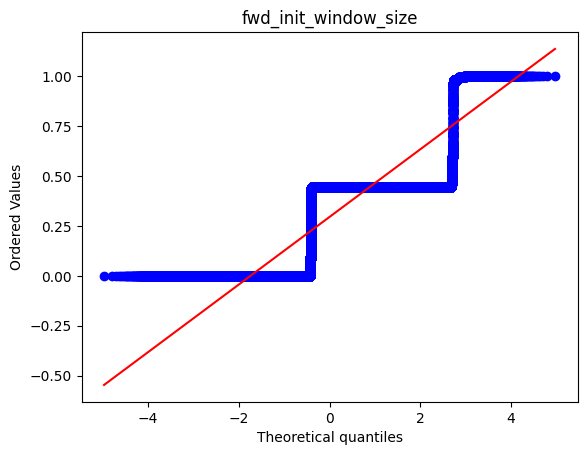

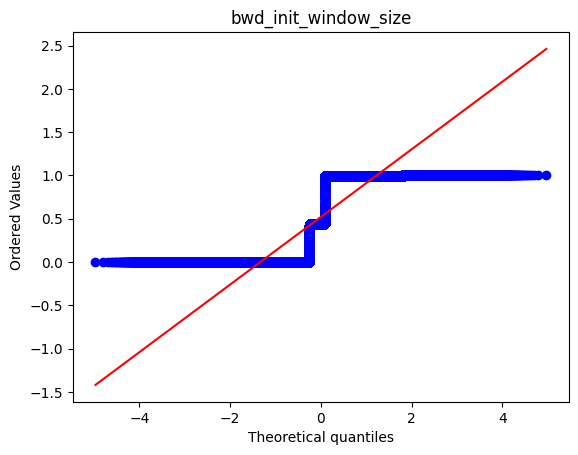

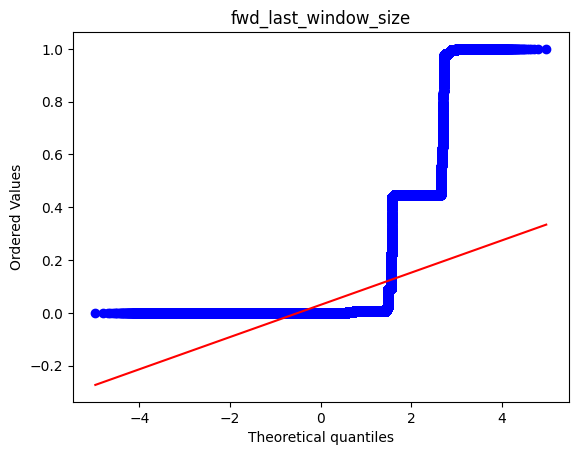

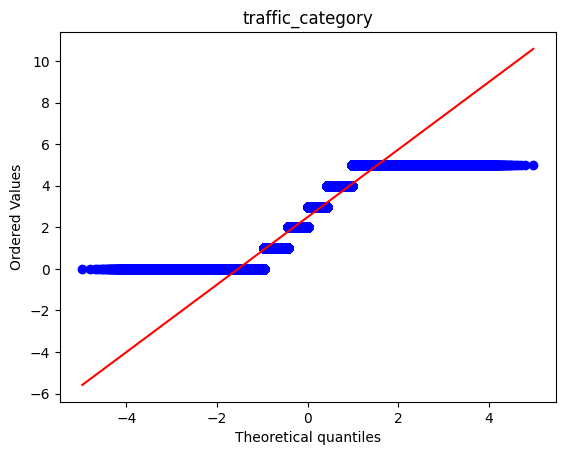

In [23]:
for col in df_resampled.columns:
    stats.probplot(df_resampled[col], dist="norm", plot=plt)
    plt.title(col)
    plt.show()

# Results

Setelah dilakukan imbalance handling dengan oversampling (membuat data baru pada value minoritas pada data target agar jumlah data sama dengan value mayoritas) dengan SMOTE, didapatkan bahwa outlier berdasarkan boxplot bertambah 1 dari 76 ke 77. selain itu, jika di cek menggunakan z-score, jumlah outlier pada setiap fitur bertambah. sebelumnya, jumlah data outlier maksimal pada salah satu fitur adalah 20 ribu. setelah dilakukan imbalance handling, outlier bertambah menjadi 120 ribu. jika dibandingkan dengan persentase outlier terhadap total data, setelah dilakukan SMOTE, jumlah outlier naik 2%. oleh karena itu, dibutuhkanlah imbalance handling yang lebih baik, seperti penggunaan model deep learning GANs. diharapkan bahwa setelah menggunakan GANs sebagai imbalance handling, outlier menurun atau setidaknya tetap. akan tetapi, dengan data yang cukup banyak, sepertinya penanganan outlier satu-satunya adalah dengan imputasi data outlier dengan rata-rata data. karena, jika menggunakan drop data outlier, sepertinya terlalu banyak data untuk di drop. namun, dengan penggunaan model LGBM sebagai model prediksi dataset, sepertinya outlier handling tidak dibutuhkan karena LGBM tahan terhadap outlier.

# Imbalance handling using GANs

In [ ]:
noise_dim = 10  # Dimension of the noise vector
data_dim = 87    # Number of features in the data
hidden_dim = 128
batch_size = 64
num_epochs = 10
learning_rate = 0.0002

class Generator(nn.Module):
    def __init__(self, noise_dim, output_dim, hidden_dim=128):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(noise_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, output_dim),
        )
    
    def forward(self, noise):
        return self.model(noise)
    
class Discriminator(nn.Module):
    def __init__(self, input_dim, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid(),
        )
    
    def forward(self, data):
        return self.model(data)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

generator = Generator(noise_dim, data_dim, hidden_dim).to(device)
discriminator = Discriminator(data_dim, hidden_dim).to(device)

# Optimizers
g_optimizer = optim.Adam(generator.parameters(), lr=learning_rate)
d_optimizer = optim.Adam(discriminator.parameters(), lr=learning_rate)

# Loss Function
criterion = nn.BCELoss()

test

In [26]:
X, y = df.drop('traffic_category', axis=1), df['traffic_category']

X = Standarization(X)
X = Normalization(X)

gans_df = pd.concat([pd.DataFrame(X, columns=X.columns), pd.DataFrame(y, columns=['traffic_category'])], axis=1)

data = gans_df.values

data = torch.tensor(data, dtype=torch.float32)

data = TensorDataset(data)

data = DataLoader(data, batch_size=batch_size, shuffle=True)

In [27]:
gans_df.head()

,Unnamed: 0.1,Unnamed: 0,uid,originh,originp,responh,responp,flow_duration,fwd_pkts_tot,bwd_pkts_tot,...,active.std,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size,traffic_category
0,0.000000,0.000000,0.677984,0.042443,0.202934,0.171589,0.006761,0.000127,0.000046,0.000043,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.445563,0.994278,0.0,3
1,0.000002,0.000003,0.635198,0.042443,0.202964,0.171589,0.006761,0.000898,0.000046,0.000043,...,0.000029,0.051177,0.051177,0.000882,0.051177,0.0,0.445563,0.994278,0.0,3
2,0.000004,0.000006,0.354189,0.042443,0.202995,0.171589,0.006761,0.000702,0.000043,0.000040,...,0.000023,0.039920,0.039920,0.000688,0.039920,0.0,0.445563,0.994278,0.0,3
3,0.000005,0.000009,0.799596,0.042443,0.203025,0.171589,0.006761,0.000575,0.000043,0.000040,...,0.000023,0.032552,0.032552,0.000561,0.032552,0.0,0.445563,0.994278,0.0,3
4,0.000007,0.000011,0.072964,0.042443,0.203056,0.171589,0.006761,0.000447,0.000043,0.000043,...,0.000023,0.025167,0.025167,0.000434,0.025167,0.0,0.445563,0.994278,0.0,3


In [ ]:
for epoch in range(num_epochs):
    for batch in data:
        real_batch = batch[0].to(device).float()
        
        # Pastikan ukuran real_labels dan fake_labels sesuai output discriminator
        real_labels = torch.ones(real_batch.size(0), 1).to(device)  # Sesuaikan ukuran
        fake_labels = torch.zeros(real_batch.size(0), 1).to(device)  # Sesuaikan ukuran
        
        # Generate noise dan fake data
        noise = torch.randn(real_batch.size(0), noise_dim).to(device)
        fake_batch = generator(noise)

        # Discriminator Loss
        d_loss_real = criterion(discriminator(real_batch), real_labels)
        d_loss_fake = criterion(discriminator(fake_batch.detach()), fake_labels)
        d_loss = d_loss_real + d_loss_fake

        # Update discriminator
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()

        # Generator Loss
        g_loss = criterion(discriminator(fake_batch), real_labels)

        # Update generator
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()

In [ ]:
# Generate synthetic data
noise = torch.randn(1000, noise_dim).to(device)  # Create noise on GPU
synthetic_data = generator(noise).detach().cpu().numpy()  # Move results to CPU for further processing

# Create a DataFrame
synthetic_df = pd.DataFrame(synthetic_data, columns=df.columns)

# Display the first few rows
print(synthetic_df.head())

   Unnamed: 0.1  Unnamed: 0       uid   originh   originp   responh   responp  \
0      0.826681    0.828807  0.168879  0.039843  0.717439  0.923256 -0.012714   
1      0.708020    0.637094  0.384477  0.008353  0.951245  0.411071  0.004286   
2      0.703367    0.629425  0.389913  0.012993  0.924272  0.482719  0.002431   
3      0.839003    0.881727  0.246417  0.038495  0.703302  0.164474 -0.013233   
4      0.677782    0.586535  0.430030  0.041118  0.764632  0.915331 -0.008681   

   flow_duration  fwd_pkts_tot  bwd_pkts_tot  ...  active.std  idle.min  \
0      -0.002601     -0.001083     -0.002012  ...   -0.001500  0.000829   
1      -0.000202      0.000927     -0.002662  ...   -0.002514  0.005898   
2      -0.000539      0.000672     -0.002611  ...   -0.002198  0.005217   
3      -0.003253     -0.005106     -0.004502  ...   -0.001454 -0.000424   
4      -0.002568     -0.000876     -0.002302  ...   -0.000299  0.001121   

   idle.max  idle.tot  idle.avg  idle.std  fwd_init_window_siz

In [30]:
synthetic_df.head()

,Unnamed: 0.1,Unnamed: 0,uid,originh,originp,responh,responp,flow_duration,fwd_pkts_tot,bwd_pkts_tot,...,active.std,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size,traffic_category
0,0.826681,0.828807,0.168879,0.039843,0.717439,0.923256,-0.012714,-0.002601,-0.001083,-0.002012,...,-0.001500,0.000829,0.001772,-0.002138,-0.004959,0.001891,-0.002955,-0.014423,0.002945,0.991683
1,0.708020,0.637094,0.384477,0.008353,0.951245,0.411071,0.004286,-0.000202,0.000927,-0.002662,...,-0.002514,0.005898,-0.008617,-0.003196,-0.002996,0.003172,-0.032512,-0.034872,0.007457,0.973039
2,0.703367,0.629425,0.389913,0.012993,0.924272,0.482719,0.002431,-0.000539,0.000672,-0.002611,...,-0.002198,0.005217,-0.007364,-0.003104,-0.003004,0.002623,-0.027886,-0.031166,0.005921,0.972960
3,0.839003,0.881727,0.246417,0.038495,0.703302,0.164474,-0.013233,-0.003253,-0.005106,-0.004502,...,-0.001454,-0.000424,0.005340,-0.005730,-0.006398,0.001129,0.431841,0.948921,0.020990,0.984661
4,0.677782,0.586535,0.430030,0.041118,0.764632,0.915331,-0.008681,-0.002568,-0.000876,-0.002302,...,-0.000299,0.001121,0.000223,-0.002552,-0.003034,-0.000713,0.000089,-0.008614,-0.003278,0.972770
